In [1]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Imports

In [2]:
!pip install torchinfo > /dev/null
!pip install torchsummary > /dev/null
!pip install einops > /dev/null
!pip install wandb > /dev/null

# General
%matplotlib inline
import os
import time
import numpy as np
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt 

# Torch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data.dataset import Dataset
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
from torchvision.utils import make_grid
from torchsummary import summary

# Image libraries
from PIL import Image
from IPython.display import display
import cv2
from PIL import ImageFile
import torchvision.transforms as transforms
ImageFile.LOAD_TRUNCATED_IMAGES = True

import warnings

warnings.filterwarnings('ignore')

In [3]:
use_cuda = torch.cuda.is_available()

# Loading the dataset

In [4]:
PATH = '/content/drive/MyDrive/INF8225-Projet/dataset/'

os.listdir(PATH)

labels = pd.read_csv(PATH+'labels.csv')

print(labels.head())
label_names = pd.read_csv(PATH + 'sample_submission.csv').keys()[1:]
print("Train folder has ", len(os.listdir(PATH+'train')),'images which matches with label\'s', len(labels),'images')

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever
Train folder has  10222 images which matches with label's 10222 images


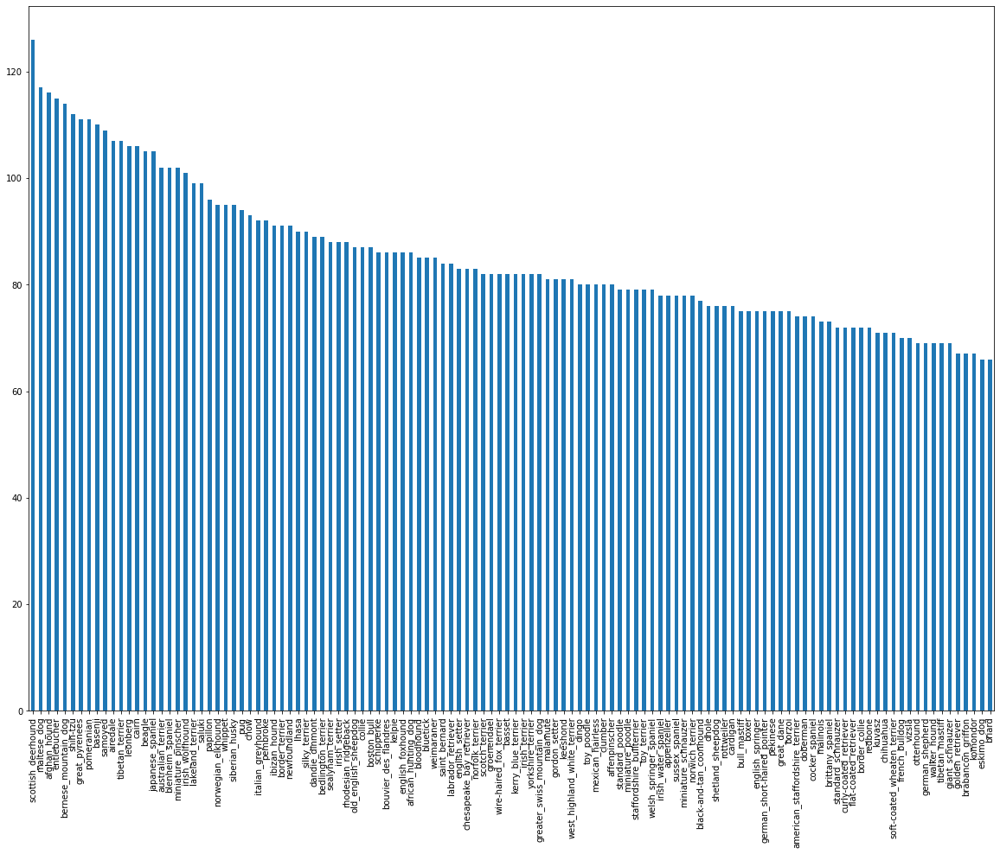

In [5]:
plt.figure(figsize=(20, 15))
labels['breed'].value_counts().plot(kind='bar')
plt.show()

In [6]:
# Creating the dictionnaries encoding breed to code

NUM_CLASSES = 120

codes = range(len(label_names))
breed_to_code = dict(zip(label_names, codes))
code_to_breed = dict(zip(codes, label_names))

selected_breed_list = list(labels.groupby('breed').count().sort_values(by='id', ascending=False).head(NUM_CLASSES).index)

coded_labels = labels[labels['breed'].isin(selected_breed_list)]
coded_labels['target'] =  [breed_to_code[x] for x in coded_labels.breed]
coded_labels['rank'] = coded_labels.groupby('breed').rank()['id']

labels_pivot = coded_labels.pivot('id', 'breed', 'target').reset_index().fillna(0)

train_dataset = labels_pivot.sample(frac=0.85)
valid_dataset = labels_pivot[~labels_pivot['id'].isin(train_dataset['id'])]
print(train_dataset.shape, valid_dataset.shape)

(8689, 121) (1533, 121)


# Image transformations

In [7]:
 # Image transformations
img_transform = {
    'valid':transforms.Compose([
        transforms.Resize(size = 224),
        transforms.CenterCrop(size = 224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'train':transforms.Compose([
        transforms.Resize(size = 224),
        transforms.CenterCrop(size = 224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'train_data_augmentation':transforms.Compose([
        transforms.Resize(size = 224),
        transforms.CenterCrop(size = 224),
        # Rotation
        transforms.RandomRotation(degrees = 30),
        # Color jitter
        transforms.ColorJitter(),
        # Horizontal flip
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])  
    ]),
    'test':transforms.Compose([
        transforms.Resize(size = 224),
        transforms.CenterCrop(size = 224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
}

In [8]:
class DogBreedDataset(torch.utils.data.Dataset):
    def __init__(self, img_dir, label, transform):
        self.img_dir = img_dir
        self.transform = transform
        self.label = label

    def __len__(self):
        return len(self.label)

    def __getitem__(self, index):
        if self.label is not None:
            img_name = '{}.jpg'.format(self.label.iloc[index, 0])
            fullname = self.img_dir + img_name
            image = Image.open(fullname)
            label = self.label.iloc[index, 1:].astype('float').to_numpy()
            label = np.argmax(label)
            if self.transform:
                image = self.transform(image)
            return [image, label]


In [9]:
batch_size = 64
num_workers = 4
train_img = DogBreedDataset(PATH+'train/', train_dataset, transform = img_transform['train'])
train_data_augmentation_img = DogBreedDataset(PATH+'train/', train_dataset, transform = img_transform['train_data_augmentation'])
valid_img = DogBreedDataset(PATH+'train/', valid_dataset, transform = img_transform['valid'])


dataloaders = {
    'train': torch.utils.data.DataLoader(train_img, batch_size, num_workers = num_workers, shuffle=True),
    'valid': torch.utils.data.DataLoader(valid_img, batch_size, num_workers = num_workers, shuffle=False)
}

dataloaders_data_augmentation = {
    'train': torch.utils.data.DataLoader(train_data_augmentation_img, batch_size, num_workers = num_workers, shuffle=True),
    'valid': torch.utils.data.DataLoader(valid_img, batch_size, num_workers = num_workers, shuffle=False)
}


# Helper functions

In [10]:
def imshow(axis, inp):
    """Denormalize and show"""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    axis.imshow(inp)

In [11]:
def visualize_model(dataloaders, model, num_images=16):
    cnt = 0
    fig = plt.figure(1, figsize=(16, 16))
    grid = ImageGrid(fig, 111, nrows_ncols=(4, 4), axes_pad=0.05)
    for i, (inputs, labels) in enumerate(dataloaders['valid']):
        if use_cuda:
            inputs, labels = inputs.cuda(), labels.cuda()

        outputs = model(inputs)
        _, preds = torch.max(outputs.data, 1)

        for j in range(inputs.size()[0]):
            ax = grid[cnt]
            imshow(ax, inputs.cpu().data[j])
            ax.text(10, 210, 
                    'Guessed: {}\nActual: {}'.format(code_to_breed[preds[j].item()], code_to_breed[labels.data[j].item()]), 
                    color='k', backgroundcolor='w', alpha=0.8)
            cnt += 1
            if cnt == num_images:
                return

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


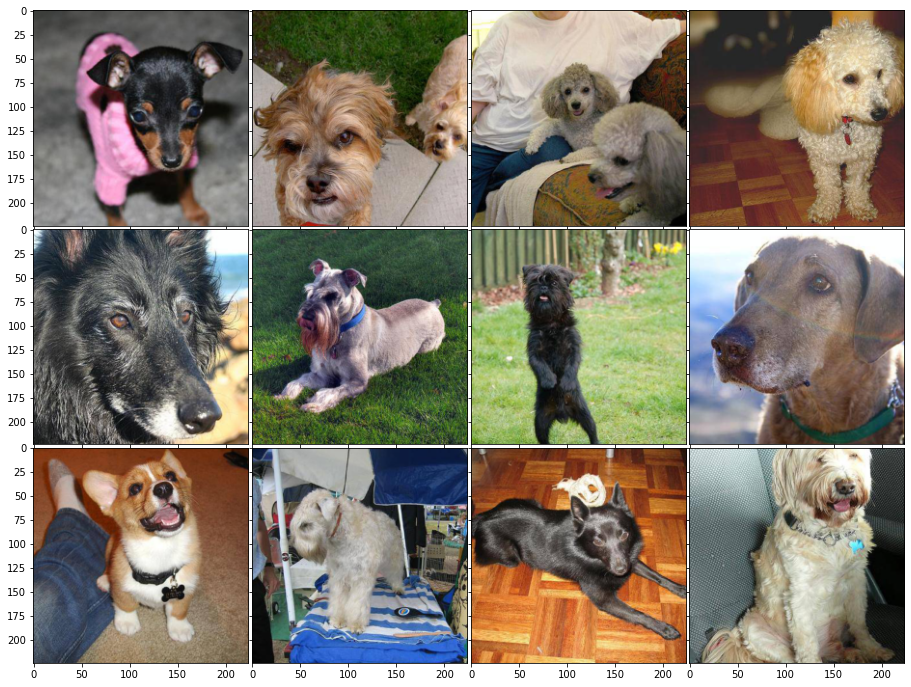

In [12]:
from mpl_toolkits.axes_grid1 import ImageGrid
img, label = next(iter(dataloaders['train']))
fig = plt.figure(1, figsize=(16, 12))
grid = ImageGrid(fig, 111, nrows_ncols=(3, 4), axes_pad=0.05)
for i in range(12):
    ax = grid[i]
    imshow(ax, img[i])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

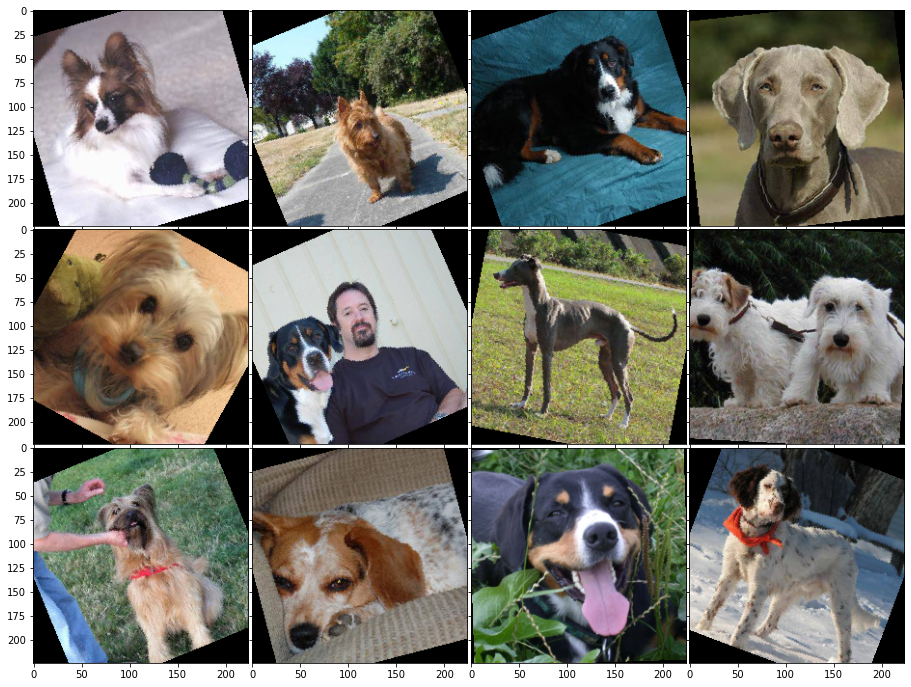

In [13]:
from mpl_toolkits.axes_grid1 import ImageGrid
img, label = next(iter(dataloaders_data_augmentation['train']))
fig = plt.figure(1, figsize=(16, 12))
grid = ImageGrid(fig, 111, nrows_ncols=(3, 4), axes_pad=0.05)
for i in range(12):
    ax = grid[i]
    imshow(ax, img[i])


In [14]:
def train(n_epochs, dataloaders, model, optimizer, criterion, scheduler, use_cuda, save_path):
    """returns trained model"""
    # Initialize tracker for minimum validation loss
    start_time = time.time()
    valid_loss_min = np.Inf

    train_losses = []
    valid_losses = []

    train_accs = []
    valid_accs = []
    
    for epoch in range(1, n_epochs+1):
        # Initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0

        train_acc = 0.0
        train_corrects = 0
        valid_acc = 0.0
        valid_corrects = 0
        
        ###################
        # Train the model #
        ###################
        model.train()
        for batch_idx, (data, target) in enumerate(dataloaders['train']):
            # Move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## Find the loss and update the model parameters accordingly
            
            optimizer.zero_grad()
            output = model(data)
            _, preds = torch.max(output.data, 1)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()
            train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))
            train_corrects += torch.sum(preds == target.data)

        if scheduler is not None:
          scheduler.step()

        ######################    
        # Validate the model #
        ######################
        model.eval()
        for batch_idx, (data, target) in enumerate(dataloaders['valid']):
            # Move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## Update the average validation loss
            output = model(data)
            _, preds = torch.max(output.data, 1)
            loss = criterion(output, target)
            valid_loss = valid_loss + ((1 / (batch_idx + 1)) * (loss.data - valid_loss))
            valid_corrects += torch.sum(preds == target.data)

        train_acc = train_corrects / len(dataloaders['train'].dataset)
        valid_acc = valid_corrects / len(dataloaders['valid'].dataset)
            
        # Print training/validation statistics 
        print('Epoch: {} \tTraining Loss: {:.4f} | Training Acc: {:.2f}% \tValidation Loss: {:.4f} | Validation Acc: {:.2f}%'.format(
            epoch, 
            train_loss,
            train_acc * 100,
            valid_loss,
            valid_acc * 100,
        ))

        train_losses.append(torch.Tensor([train_loss]).cpu())
        valid_losses.append(torch.Tensor([valid_loss]).cpu())

        train_accs.append(torch.Tensor([train_acc]).cpu())
        valid_accs.append(torch.Tensor([valid_acc]).cpu())
        
        ## Save the model if validation loss has decreased
        if valid_loss < valid_loss_min:
            torch.save(model.state_dict(), save_path)
            valid_loss_min = valid_loss    

    train_stats = pd.DataFrame({'training_loss':train_losses, 
                  'training_acc':train_accs, 
                  'validation_loss':valid_losses, 
                  'validation_acc':valid_accs})
    
    print('Training time: {:10f} minutes'.format((time.time()-start_time)/60))

    # return trained model
    return model, train_stats

# CNN

Custom CNN implementation

In [15]:
class Net(nn.Module):
    def __init__(self, in_channels, num_classes, dropout=0.5):
        super(Net, self).__init__()
        ## Define layers of a CNN
        
        self.conv_layers = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        
        self.linear_layers = nn.Sequential(
            nn.Linear(in_features=512*7*7, out_features=4096),
            nn.ReLU(),
            nn.Dropout2d(dropout),
            nn.Linear(in_features=4096, out_features=4096),
            nn.ReLU(),
            nn.Dropout2d(dropout),
            nn.Linear(in_features=4096, out_features=num_classes)
        )
        
        
    def forward(self, x):
        ## Define forward behavior

        x = self.conv_layers(x)
        # flatten to prepare for the fully connected layers
        x = x.view(x.size(0), -1)
        x = self.linear_layers(x)
        return x

In [17]:
def plot_training_statistics(train_stats):
    
    fig, axes = plt.subplots(2, figsize=(15,15))
    axes[0].plot(train_stats['training_loss'], label='training_loss')
    axes[0].plot(train_stats['validation_loss'], label='validation_loss')
    axes[1].plot(train_stats['training_acc'], label='training_acc')
    axes[1].plot(train_stats['validation_acc'], label='validation_acc')
    
    axes[0].set_xlabel("Number of Epochs"), axes[0].set_ylabel("Loss")
    axes[1].set_xlabel("Number of Epochs"), axes[1].set_ylabel("Accuracy in %")
    
    axes[0].legend(), axes[1].legend()

In [18]:
# instantiate the CNN
model_scratch = Net(in_channels=3, num_classes=NUM_CLASSES, dropout=0.5)

# move tensors to GPU if CUDA is available
if use_cuda:
    model_scratch.cuda()

In [19]:
# Summary of the model
summary(model_scratch, input_size=(3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
         MaxPool2d-3         [-1, 64, 112, 112]               0
            Conv2d-4        [-1, 128, 112, 112]          73,856
              ReLU-5        [-1, 128, 112, 112]               0
         MaxPool2d-6          [-1, 128, 56, 56]               0
            Conv2d-7          [-1, 256, 56, 56]         295,168
              ReLU-8          [-1, 256, 56, 56]               0
            Conv2d-9          [-1, 256, 56, 56]         590,080
             ReLU-10          [-1, 256, 56, 56]               0
        MaxPool2d-11          [-1, 256, 28, 28]               0
           Conv2d-12          [-1, 512, 28, 28]       1,180,160
             ReLU-13          [-1, 512, 28, 28]               0
           Conv2d-14          [-1, 512,

In [20]:
criterion = nn.CrossEntropyLoss()
optimizer_sgd = torch.optim.SGD(model_scratch.parameters(), lr=0.1, momentum = 0.9, weight_decay=0.1)
optimizer_adam = torch.optim.Adam(model_scratch.parameters(), lr=0.01, betas=(0.9, 0.999), eps=1e-08, weight_decay=0.1)
lr_scheduler_scratch = optim.lr_scheduler.StepLR(optimizer_adam, step_size=5, gamma=0.1)

In [21]:
# train the model without data augmentation
model_scratch, scratch_train_stats = train(
    n_epochs = 10, 
    dataloaders = dataloaders,
    model = model_scratch,
    optimizer = optimizer_adam, 
    criterion = criterion,
    scheduler = lr_scheduler_scratch,
    use_cuda = use_cuda,
    save_path = 'model_scratch.pt'
)

# load the model that got the best validation accuracy
model_scratch.load_state_dict(torch.load('model_scratch.pt'))

Epoch: 1 	Training Loss: 4.7867 | Training Acc: 0.86% 	Validation Loss: 4.7866 | Validation Acc: 0.39%
Epoch: 2 	Training Loss: 4.7867 | Training Acc: 0.84% 	Validation Loss: 4.7849 | Validation Acc: 1.30%
Epoch: 3 	Training Loss: 4.7871 | Training Acc: 0.99% 	Validation Loss: 4.7870 | Validation Acc: 0.98%
Epoch: 4 	Training Loss: 4.7868 | Training Acc: 1.06% 	Validation Loss: 4.7868 | Validation Acc: 0.59%
Epoch: 5 	Training Loss: 4.7866 | Training Acc: 1.04% 	Validation Loss: 4.7876 | Validation Acc: 0.59%
Epoch: 6 	Training Loss: 4.7864 | Training Acc: 0.97% 	Validation Loss: 4.7869 | Validation Acc: 0.98%
Epoch: 7 	Training Loss: 4.7861 | Training Acc: 1.01% 	Validation Loss: 4.7868 | Validation Acc: 0.98%
Epoch: 8 	Training Loss: 4.7861 | Training Acc: 1.28% 	Validation Loss: 4.7868 | Validation Acc: 0.98%
Epoch: 9 	Training Loss: 4.7860 | Training Acc: 1.14% 	Validation Loss: 4.7867 | Validation Acc: 0.98%
Epoch: 10 	Training Loss: 4.7860 | Training Acc: 1.15% 	Validation Loss: 

<All keys matched successfully>

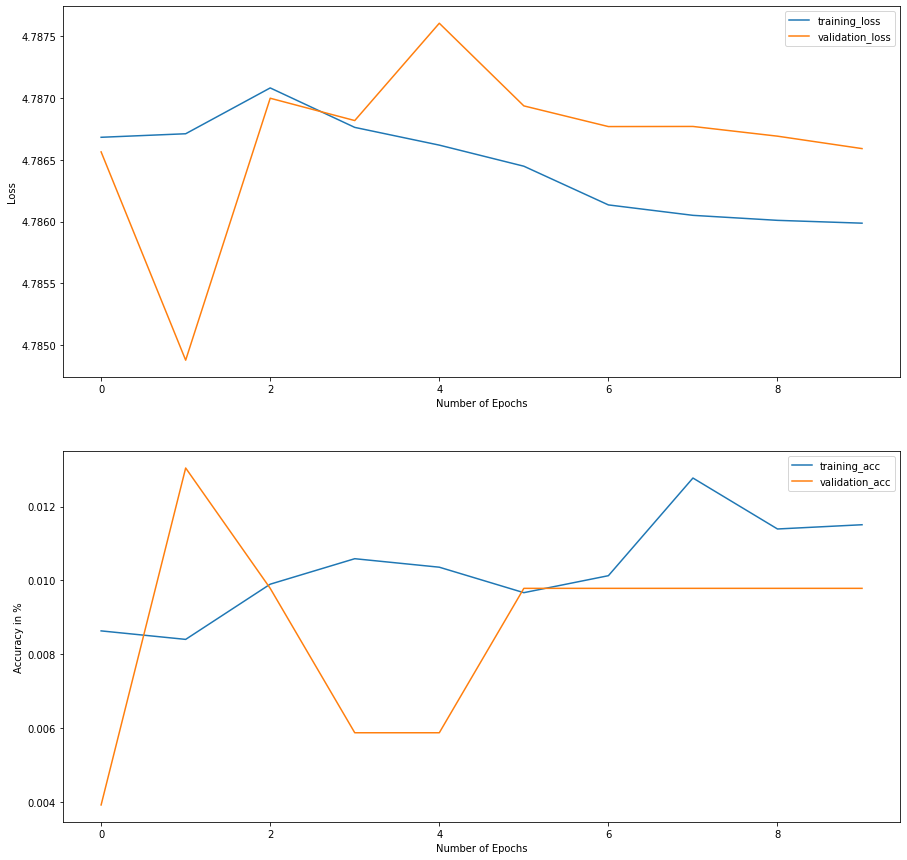

In [22]:
plot_training_statistics(scratch_train_stats)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


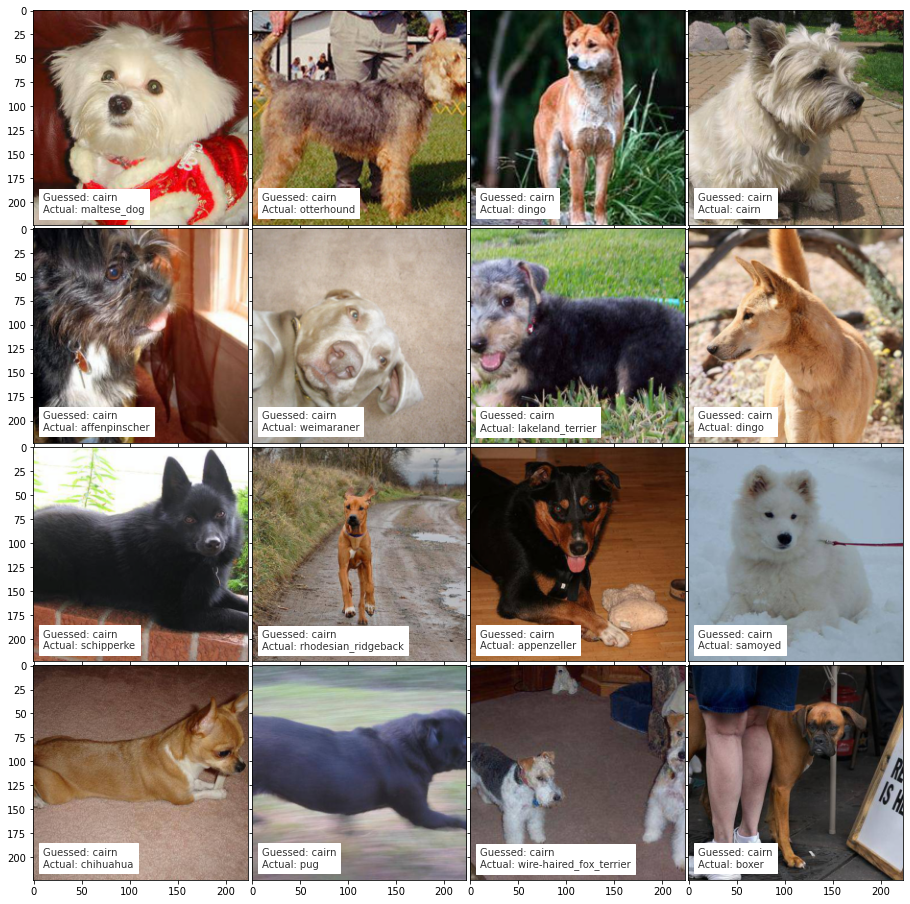

In [23]:
visualize_model(dataloaders, model_scratch)

# Transfer learning using ResNet50

In [24]:
##  Specify model architecture 
model_transfer = models.resnet50(pretrained=True)

# Freeze training for all "features" layers
for param in model_transfer.parameters():
    param.requires_grad = False
    
# replace the last fully connected layer with a Linear layer of outpit size NUM_CLASSES (number of classes)
in_features = model_transfer.fc.in_features
model_transfer.fc = nn.Linear(in_features, NUM_CLASSES)

if use_cuda:
    model_transfer = model_transfer.cuda()

In [25]:
criterion_transfer = nn.CrossEntropyLoss()
model_transfer_grad_parameters = filter(lambda p: p.requires_grad, model_transfer.parameters())
optimizer_transfer = torch.optim.SGD(model_transfer_grad_parameters, lr=0.01)
lr_scheduler_transfer = optim.lr_scheduler.StepLR(optimizer_transfer, step_size=5, gamma=0.1)

In [26]:
# train the model without data augmentation
model_transfer, transfer_train_stats = train(
    n_epochs = 15, 
    dataloaders = dataloaders,
    model = model_transfer,
    optimizer = optimizer_transfer, 
    criterion = criterion_transfer,
    scheduler = lr_scheduler_transfer,
    use_cuda = use_cuda,
    save_path = 'model_transfer.pt'
)

# load the model that got the best validation accuracy
model_transfer.load_state_dict(torch.load('model_transfer.pt'))

Epoch: 1 	Training Loss: 4.2429 | Training Acc: 22.34% 	Validation Loss: 3.6904 | Validation Acc: 42.92%
Epoch: 2 	Training Loss: 3.2268 | Training Acc: 55.82% 	Validation Loss: 2.7957 | Validation Acc: 61.45%
Epoch: 3 	Training Loss: 2.4736 | Training Acc: 69.39% 	Validation Loss: 2.1778 | Validation Acc: 69.73%
Epoch: 4 	Training Loss: 1.9565 | Training Acc: 76.53% 	Validation Loss: 1.7614 | Validation Acc: 75.08%
Epoch: 5 	Training Loss: 1.6143 | Training Acc: 80.18% 	Validation Loss: 1.4881 | Validation Acc: 77.30%
Epoch: 6 	Training Loss: 1.4539 | Training Acc: 82.41% 	Validation Loss: 1.4687 | Validation Acc: 78.02%
Epoch: 7 	Training Loss: 1.4280 | Training Acc: 83.11% 	Validation Loss: 1.4428 | Validation Acc: 77.95%
Epoch: 8 	Training Loss: 1.4032 | Training Acc: 83.34% 	Validation Loss: 1.4235 | Validation Acc: 79.06%
Epoch: 9 	Training Loss: 1.3778 | Training Acc: 84.21% 	Validation Loss: 1.4173 | Validation Acc: 78.67%
Epoch: 10 	Training Loss: 1.3616 | Training Acc: 83.91%

<All keys matched successfully>

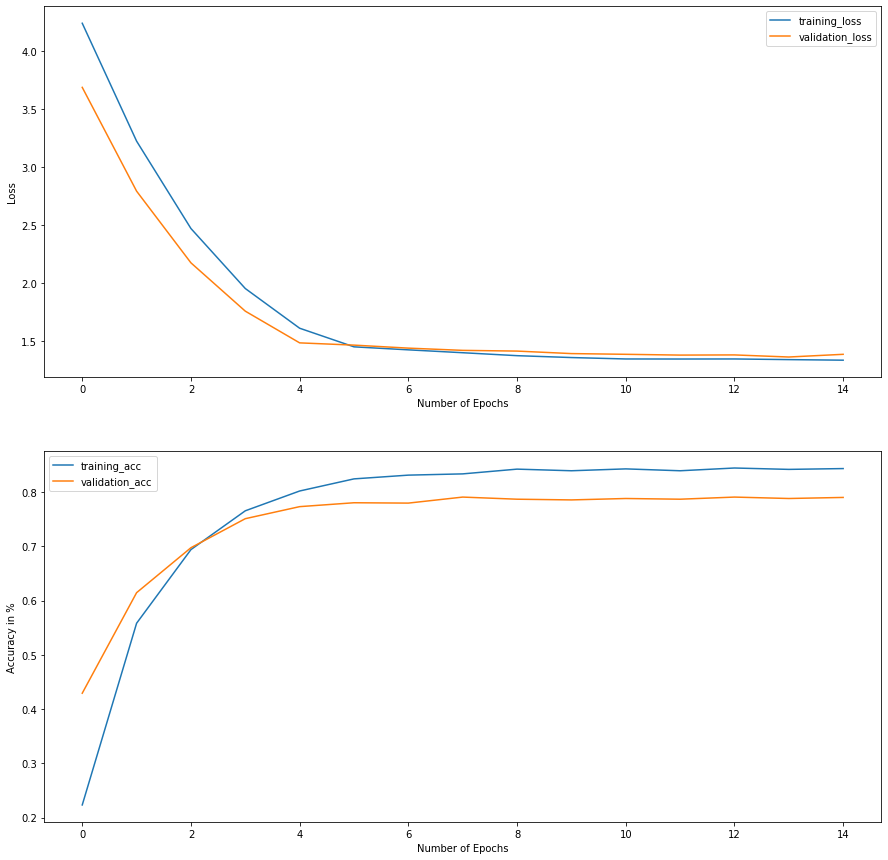

In [27]:
plot_training_statistics(transfer_train_stats)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


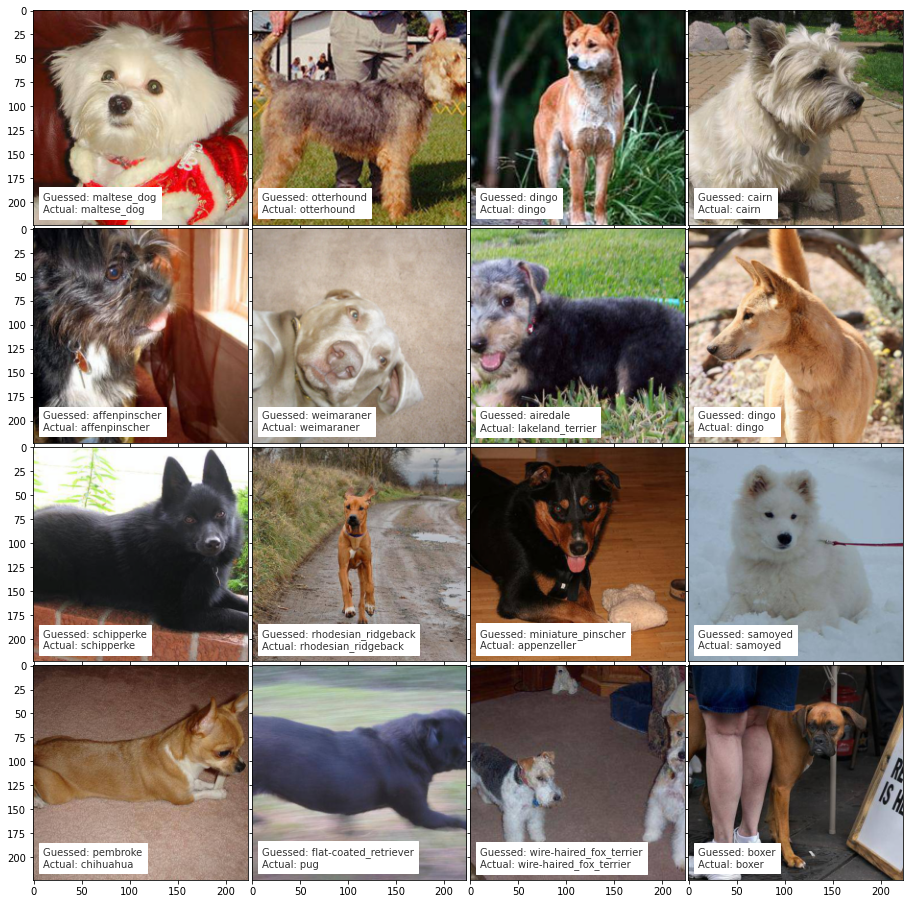

In [28]:
visualize_model(dataloaders, model_transfer)

# Transfer learning with DenseNet121

In [29]:
##  Specify model architecture 
model_transfer_densenet = models.densenet121(pretrained=True)

# Freeze training for all "features" layers
for param in model_transfer_densenet.parameters():
    param.requires_grad = False
    
# replace the last fully connected layer with a Linear layer of outpit size NUM_CLASSES (number of classes)
in_features = model_transfer_densenet.classifier.in_features
model_transfer_densenet.classifier = nn.Linear(in_features, NUM_CLASSES)

if use_cuda:
    model_transfer_densenet = model_transfer_densenet.cuda()

In [30]:
criterion_transfer = nn.CrossEntropyLoss()
model_transfer_densenet_grad_parameters = filter(lambda p: p.requires_grad, model_transfer_densenet.parameters())
optimizer_transfer_densenet = torch.optim.SGD(model_transfer_densenet_grad_parameters, lr=0.01)
lr_scheduler_transfer_densenet = optim.lr_scheduler.StepLR(optimizer_transfer_densenet, step_size=5, gamma=0.1)

In [31]:
# train the model without data augmentation
model_transfer_densenet, transfer_train_stats_densenet = train(
    n_epochs = 15, 
    dataloaders = dataloaders,
    model = model_transfer_densenet,
    optimizer = optimizer_transfer_densenet, 
    criterion = criterion_transfer,
    scheduler = lr_scheduler_transfer_densenet,
    use_cuda = use_cuda,
    save_path = 'model_transfer_densenet.pt'
)

# load the model that got the best validation accuracy
model_transfer_densenet.load_state_dict(torch.load('model_transfer_densenet.pt'))

Epoch: 1 	Training Loss: 4.2723 | Training Acc: 16.61% 	Validation Loss: 3.7080 | Validation Acc: 37.18%
Epoch: 2 	Training Loss: 3.2614 | Training Acc: 49.20% 	Validation Loss: 2.8545 | Validation Acc: 53.29%
Epoch: 3 	Training Loss: 2.5276 | Training Acc: 63.76% 	Validation Loss: 2.2748 | Validation Acc: 63.54%
Epoch: 4 	Training Loss: 2.0325 | Training Acc: 71.69% 	Validation Loss: 1.8957 | Validation Acc: 69.41%
Epoch: 5 	Training Loss: 1.6967 | Training Acc: 75.95% 	Validation Loss: 1.6133 | Validation Acc: 72.99%
Epoch: 6 	Training Loss: 1.5341 | Training Acc: 78.66% 	Validation Loss: 1.5823 | Validation Acc: 73.58%
Epoch: 7 	Training Loss: 1.5129 | Training Acc: 79.20% 	Validation Loss: 1.5759 | Validation Acc: 73.65%
Epoch: 8 	Training Loss: 1.4855 | Training Acc: 79.80% 	Validation Loss: 1.5415 | Validation Acc: 73.45%
Epoch: 9 	Training Loss: 1.4714 | Training Acc: 79.78% 	Validation Loss: 1.5276 | Validation Acc: 73.91%
Epoch: 10 	Training Loss: 1.4455 | Training Acc: 80.56%

<All keys matched successfully>

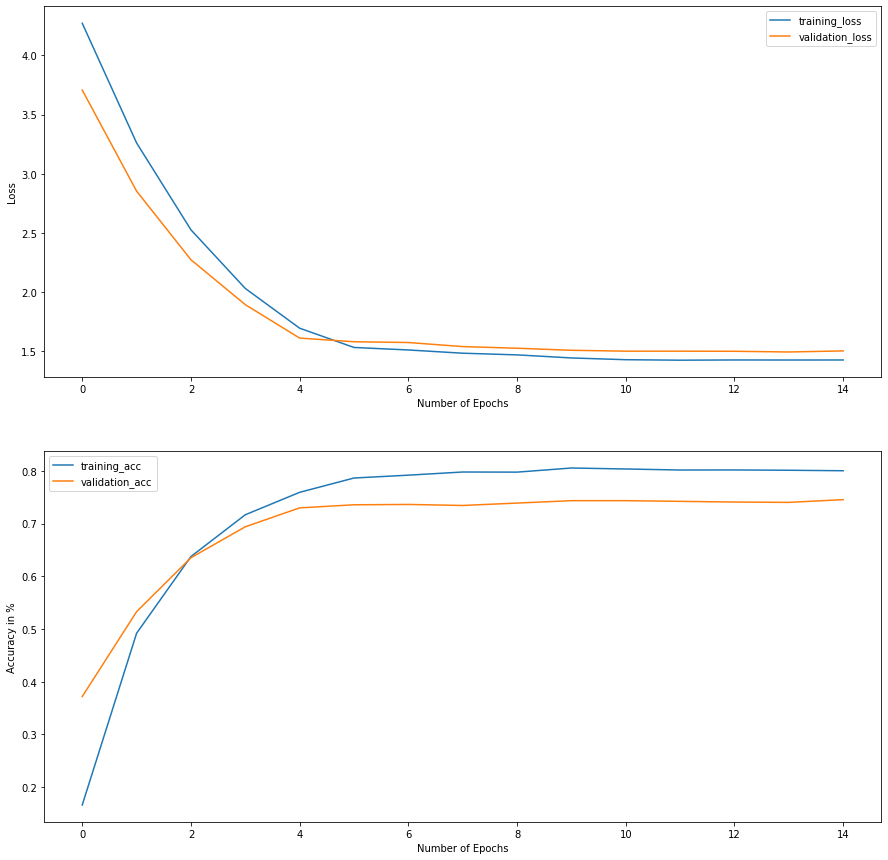

In [32]:
plot_training_statistics(transfer_train_stats_densenet)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


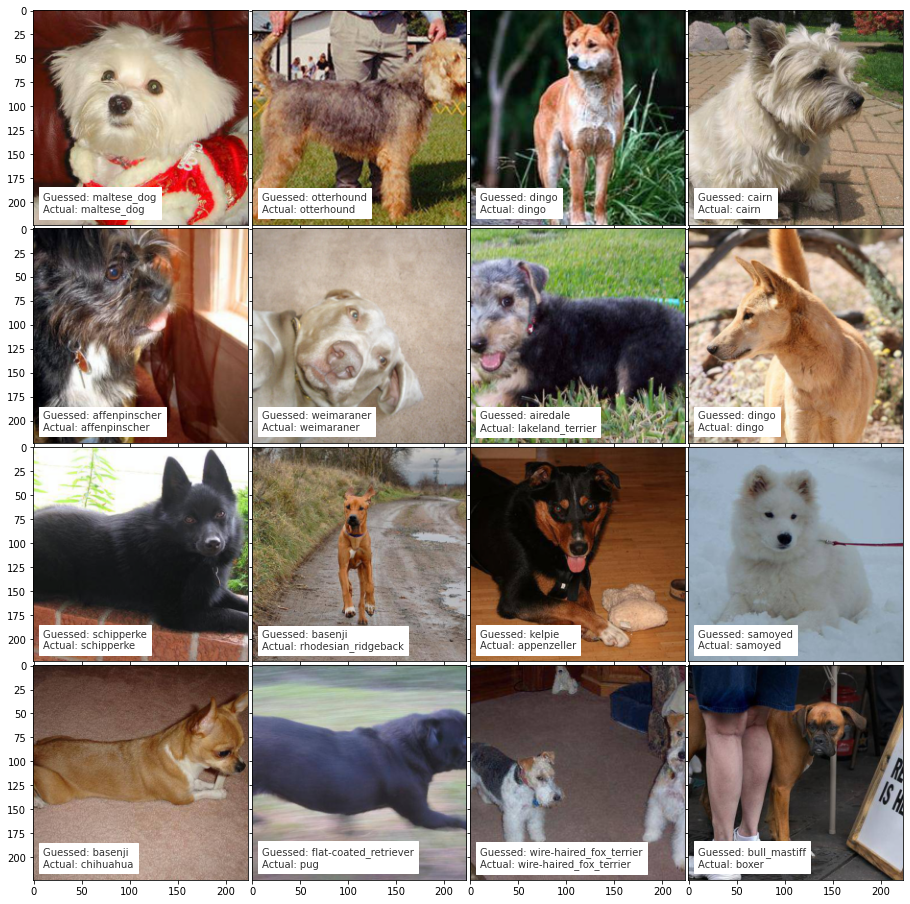

In [33]:
visualize_model(dataloaders, model_transfer_densenet)

# Ensemble method

In [82]:
class EnsembleMethod(nn.Module):
    def __init__(self, models, num_classes = 120, use_cuda = True):
        super(EnsembleMethod,self).__init__()

        self.models = models
        self.num_models = len(models)
        self.num_features = 0

        for model in self.models:
          # Get last layer name for models that do not use the same last layer name
          *_, last = model.named_children()
          # Replace the last fully connected layer with an identity layer
          if last[0] == 'fc':
            in_features = model.fc.in_features
            model.fc = nn.Identity()
            self.num_features += in_features
          elif last[0] == 'classifier':
            in_features = model.classifier.in_features
            model.classifier = nn.Identity()
            self.num_features += in_features
          if use_cuda:
            model = model.cuda()
        
        # We had a linear layer which expects the concatenated output of all models
        # This outputs will then be used in a new linear layer which takes as
        # input dimension the total number of features (concat) and outputs the
        # final classes (120 in our default case)
        self.classifier = nn.Linear(self.num_features, num_classes)
    
    
    def forward(self, x):
        x_output_list = []

        for model in self.models:
          x_output = model(x.clone())
          x_output = x_output.view(x_output.size(0), -1)
          x_output_list.append(x_output)
        
        
        #final
        x = torch.cat(x_output_list, dim=1)
        x = self.classifier(F.relu(x))
        
        return x

In [83]:
# Initialization of ResNet-50 pretrained model
model_resnet50 = models.resnet50(pretrained=True)

# Freeze training for all "features" layers
for param in model_resnet50.parameters():
    param.requires_grad = False

if use_cuda:
    model_resnet50 = model_resnet50.cuda()

# Initialization of DenseNet-161 pretrained model
model_densenet161 = models.densenet161(pretrained=True)

# Freeze training for all "features" layers
for param in model_densenet161.parameters():
    param.requires_grad = False

if use_cuda:
    model_densenet161 = model_densenet161.cuda()

In [84]:
model_list = [
  model_resnet50,
  model_densenet161,
]

In [85]:
# Creation of ensemble model from declared model list
ensemble_model = EnsembleMethod(model_list, num_classes=NUM_CLASSES, use_cuda=use_cuda)

if use_cuda:
    ensemble_model = ensemble_model.cuda()

In [86]:
criterion_ensemble_model = nn.CrossEntropyLoss()
ensemble_model_grad_parameters = filter(lambda p: p.requires_grad, ensemble_model.parameters())
optimizer_ensemble_model = torch.optim.SGD(ensemble_model_grad_parameters, lr=0.1)
lr_scheduler_ensemble_model = optim.lr_scheduler.StepLR(optimizer_ensemble_model, step_size=5, gamma=0.1)

In [87]:
# train the model without data augmentation
ensemble_model, train_stats_ensemble_model = train(
    n_epochs = 15, 
    dataloaders = dataloaders,
    model = ensemble_model,
    optimizer = optimizer_ensemble_model, 
    criterion = criterion_ensemble_model,
    scheduler = lr_scheduler_ensemble_model,
    use_cuda = use_cuda,
    save_path = 'ensemble_model.pt'
)

# load the model that got the best validation accuracy
ensemble_model.load_state_dict(torch.load('ensemble_model.pt'))

Epoch: 1 	Training Loss: 1.6899 | Training Acc: 61.41% 	Validation Loss: 0.6519 | Validation Acc: 81.93%
Epoch: 2 	Training Loss: 0.4606 | Training Acc: 88.17% 	Validation Loss: 0.5764 | Validation Acc: 83.30%
Epoch: 3 	Training Loss: 0.3214 | Training Acc: 92.08% 	Validation Loss: 0.5012 | Validation Acc: 85.00%
Epoch: 4 	Training Loss: 0.2469 | Training Acc: 93.95% 	Validation Loss: 0.4743 | Validation Acc: 85.26%
Epoch: 5 	Training Loss: 0.2035 | Training Acc: 95.21% 	Validation Loss: 0.4693 | Validation Acc: 85.06%
Epoch: 6 	Training Loss: 0.1464 | Training Acc: 97.53% 	Validation Loss: 0.4100 | Validation Acc: 87.28%
Epoch: 7 	Training Loss: 0.1346 | Training Acc: 97.68% 	Validation Loss: 0.4089 | Validation Acc: 87.48%
Epoch: 8 	Training Loss: 0.1330 | Training Acc: 97.86% 	Validation Loss: 0.4070 | Validation Acc: 87.61%
Epoch: 9 	Training Loss: 0.1309 | Training Acc: 98.02% 	Validation Loss: 0.4083 | Validation Acc: 86.95%
Epoch: 10 	Training Loss: 0.1299 | Training Acc: 98.16%

<All keys matched successfully>

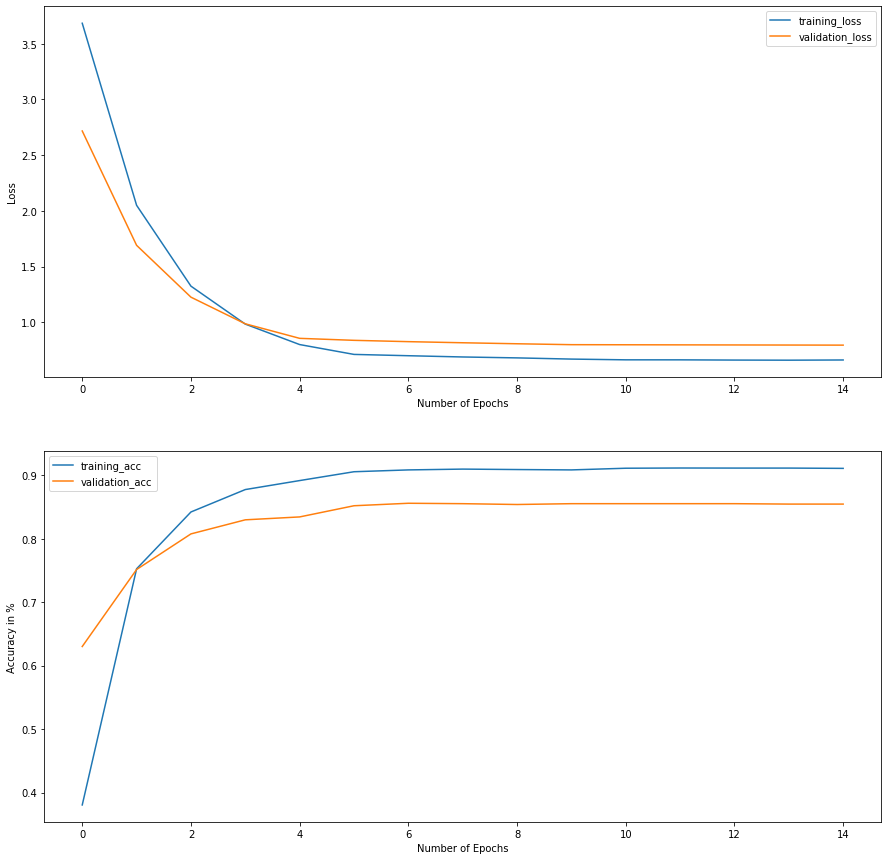

In [40]:
plot_training_statistics(train_stats_ensemble_model)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


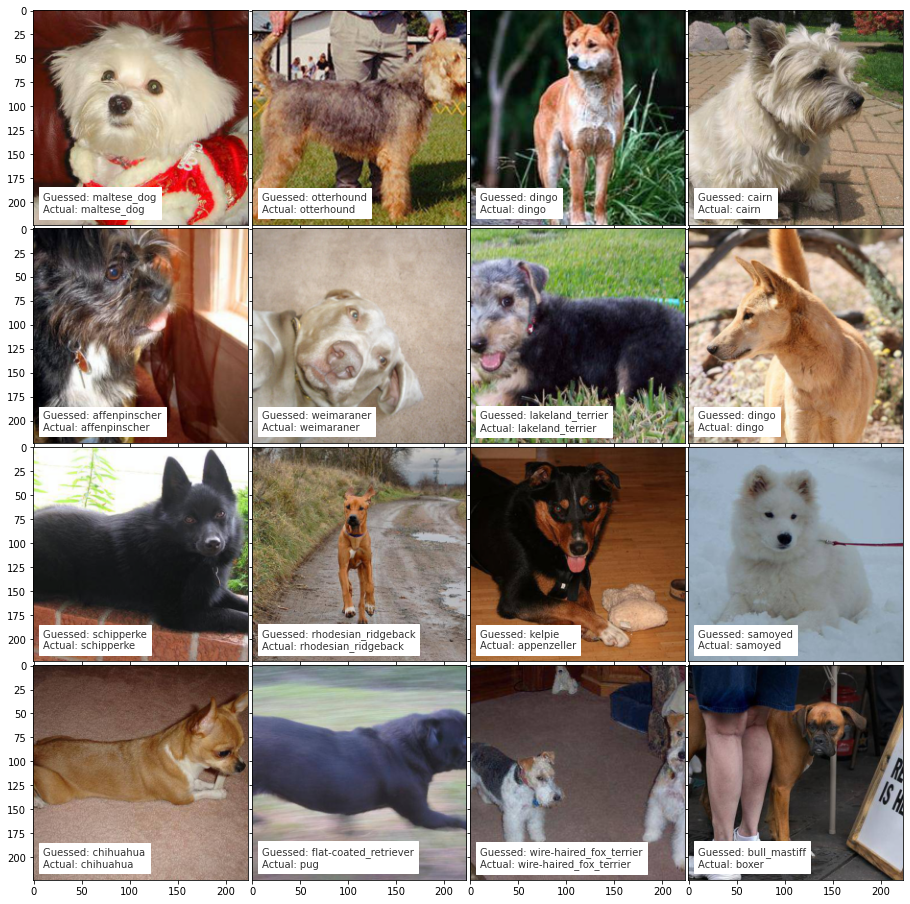

In [41]:
visualize_model(dataloaders, ensemble_model)

In [42]:
# Initialization of ResNet-50 pretrained model
model_resnet50 = models.resnet50(pretrained=True)

# Freeze training for all "features" layers
for param in model_resnet50.parameters():
    param.requires_grad = False

if use_cuda:
    model_resnet50 = model_resnet50.cuda()

# Initialization of DenseNet-161 pretrained model
model_densenet161 = models.densenet161(pretrained=True)

# Freeze training for all "features" layers
for param in model_densenet161.parameters():
    param.requires_grad = False

if use_cuda:
    model_densenet161 = model_densenet161.cuda()

In [43]:
# List of models to pass to our ensemble method
model_list = [
  model_resnet50,
  model_densenet161,
]

In [44]:
# Creation of ensemble model from declared model list
ensemble_model_data_augmentation = EnsembleMethod(model_list, num_classes=NUM_CLASSES, use_cuda=use_cuda)

if use_cuda:
    ensemble_model_data_augmentation = ensemble_model_data_augmentation.cuda()

In [45]:
# Summary of the model
summary(ensemble_model_data_augmentation, input_size=(3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 120]         510,840
Total params: 510,840
Trainable params: 510,840
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.57
Forward/backward pass size (MB): 0.00
Params size (MB): 1.95
Estimated Total Size (MB): 2.52
----------------------------------------------------------------


In [46]:
criterion_ensemble_model_data_augmentation = nn.CrossEntropyLoss()
ensemble_model_data_augmentation_grad_parameters = filter(lambda p: p.requires_grad, ensemble_model_data_augmentation.parameters())
optimizer_ensemble_model_data_augmentation = torch.optim.SGD(ensemble_model_data_augmentation_grad_parameters, lr=0.01)
lr_scheduler_ensemble_model_data_augmentation = optim.lr_scheduler.StepLR(optimizer_ensemble_model_data_augmentation, step_size=5, gamma=0.1)

In [47]:
# train the model with data augmentation
ensemble_model_data_augmentation, train_stats_ensemble_model_data_augmentation = train(
    n_epochs = 15, 
    dataloaders = dataloaders_data_augmentation,
    model = ensemble_model_data_augmentation,
    optimizer = optimizer_ensemble_model_data_augmentation, 
    criterion = criterion_ensemble_model_data_augmentation,
    scheduler = lr_scheduler_ensemble_model_data_augmentation,
    use_cuda = use_cuda,
    save_path = 'ensemble_model_data_augmentation.pt'
)

# load the model that got the best validation accuracy
ensemble_model_data_augmentation.load_state_dict(torch.load('ensemble_model_data_augmentation.pt'))

Epoch: 1 	Training Loss: 3.9258 | Training Acc: 30.53% 	Validation Loss: 2.9391 | Validation Acc: 57.60%
Epoch: 2 	Training Loss: 2.5059 | Training Acc: 65.15% 	Validation Loss: 1.8453 | Validation Acc: 73.52%
Epoch: 3 	Training Loss: 1.7338 | Training Acc: 76.64% 	Validation Loss: 1.3155 | Validation Acc: 80.43%
Epoch: 4 	Training Loss: 1.3356 | Training Acc: 80.60% 	Validation Loss: 1.0532 | Validation Acc: 80.23%
Epoch: 5 	Training Loss: 1.1113 | Training Acc: 82.77% 	Validation Loss: 0.8865 | Validation Acc: 83.11%
Epoch: 6 	Training Loss: 0.9917 | Training Acc: 84.75% 	Validation Loss: 0.8687 | Validation Acc: 83.50%
Epoch: 7 	Training Loss: 0.9820 | Training Acc: 85.03% 	Validation Loss: 0.8564 | Validation Acc: 83.24%
Epoch: 8 	Training Loss: 0.9632 | Training Acc: 85.31% 	Validation Loss: 0.8455 | Validation Acc: 83.43%
Epoch: 9 	Training Loss: 0.9533 | Training Acc: 85.27% 	Validation Loss: 0.8350 | Validation Acc: 83.50%
Epoch: 10 	Training Loss: 0.9381 | Training Acc: 85.61%

<All keys matched successfully>

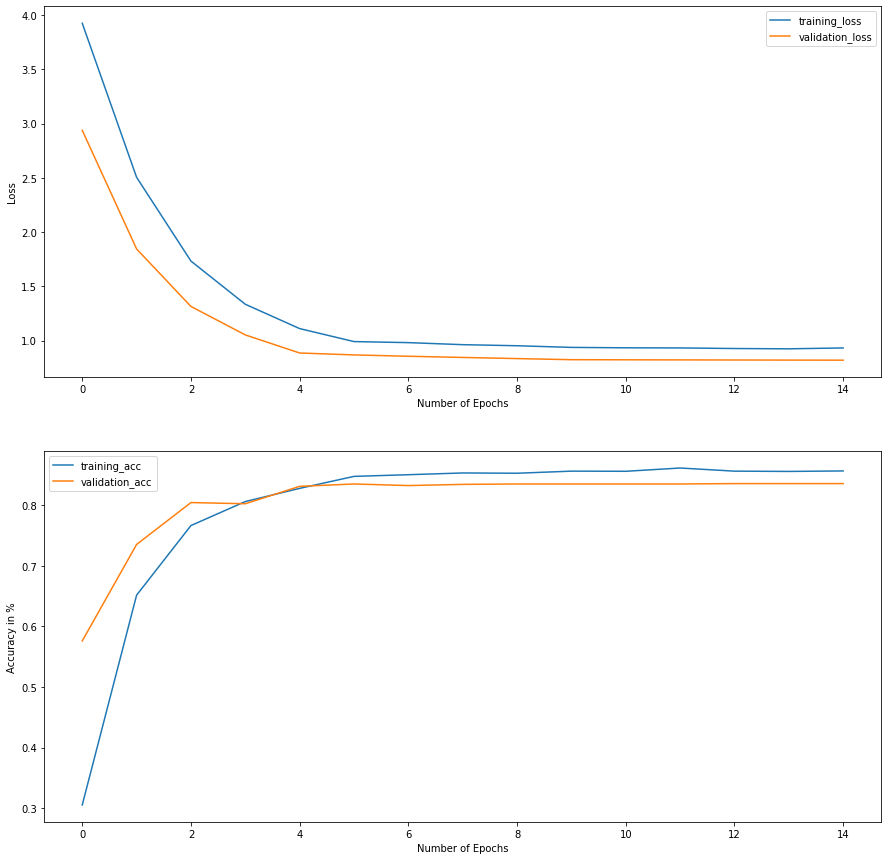

In [48]:
plot_training_statistics(train_stats_ensemble_model_data_augmentation)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


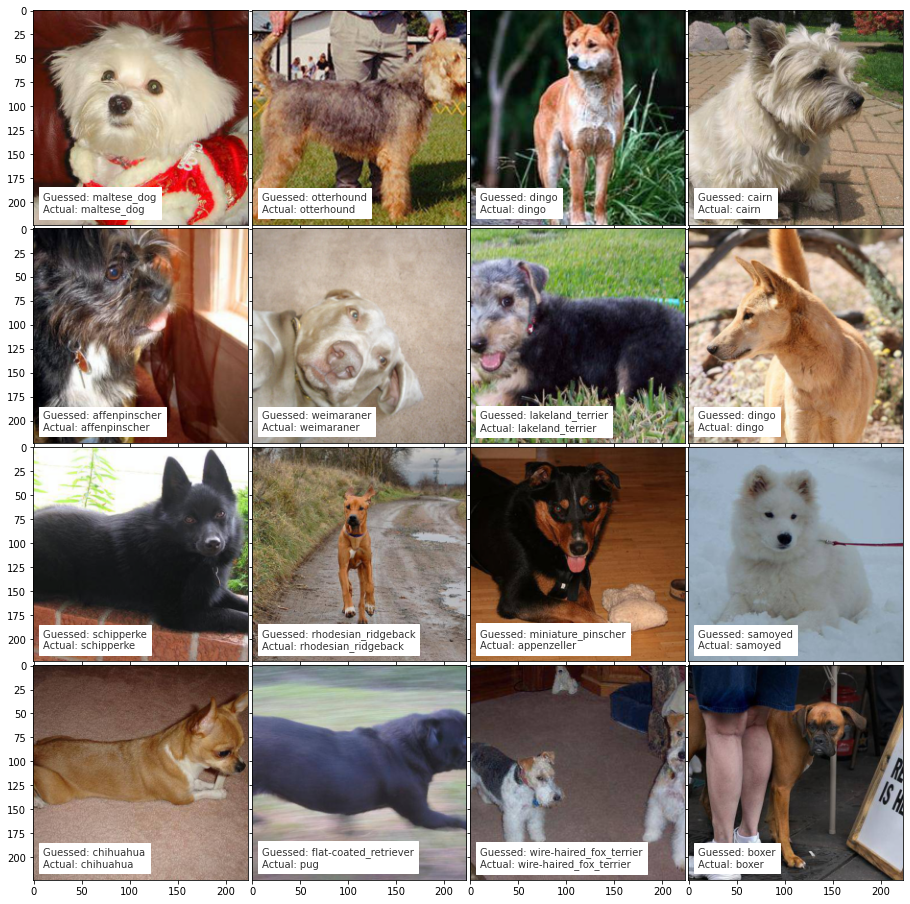

In [49]:
visualize_model(dataloaders_data_augmentation, ensemble_model_data_augmentation)